#Emotion Detection & Sentiment Analysis System for Audio Data 
Team Members
- Darpan Mehra
- Shubham Parulekar
- Tejal Rawale
- Anirudh Sankaranarayanan





### Setting up environment

In [ ]:
## Uncomment the code inorder to install corresponding library
## NOTE : You may use conda or any package manager over pip as well.

#!pip install scikit-learn
#!pip install seaborn
#!pip install matplotlib
!pip install SpeechRecognition
#!pip install librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.8/32.8 MB 12.6 MB/s eta 0:00:00


In [ ]:
#importing required libraries

#system libraries
import os
import sys
import csv
import urllib.request
import zipfile

#data processing
import pandas as pd
import numpy as np

#model processing
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split

#model metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, f1_score

#neural network
import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential

#audio based models
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.utils import np_utils, to_categorical
from keras.callbacks import ModelCheckpoint

#text based models
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.layers import Embedding, Bidirectional, GRU, Dense

#librosa is used for analyzing audio and music
import librosa
import librosa.effects as le
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

#explore audio files
from IPython.display import Audio

#convert audio to text files
import speech_recognition as sr

#text preprocessing
import re
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize

#wordcloud
from wordcloud import WordCloud, STOPWORDS

#suppressing warnings other than system
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
#mounting with google drive
from google.colab import drive
drive.mount('/content/drive')

#setting file paths constants
file_loc = "" #add the file context
#file_loc = "/content/drive/MyDrive/Data" 
data_loc = "/surrey-audiovisual-expressed-emotion-savee/ALL/"
out_loc = file_loc+"/out"
Savee = file_loc + data_loc

Mounted at /content/drive


### Loading dataset

In [ ]:
#map required to identify type of emotion from the file name
#example : DC_a01.wav => a indicates angry
emotion_map = {
    'h': 'happy',
    'sa': 'sad',
    'n': 'neutral',
    'a': 'angry',
    'd': 'disgust',
    'f': 'fear',
    'su': 'surprise'
}

#read sound files from the directory
file_emotion = []
file_path = []
savee_directory_list = os.listdir(Savee)
for file in savee_directory_list:
    file_path.append(Savee + file)
    file_emotion.append(emotion_map.get(file.split('_')[1][:-6])) #default=None if key not found
        
#dataframe for emotion from files
df_emotion = pd.DataFrame(file_emotion, columns=['emotion'])

#dataframe for path of files
df_path = pd.DataFrame(file_path, columns=['path'])

#concat path and emotions
df_audio = pd.concat([df_emotion, df_path], axis=1)
df_audio.head()

,emotion,path
0,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
1,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
2,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
3,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
4,angry,/content/drive/MyDrive/Data/surrey-audiovisual...


In [ ]:
#changing data type of emotion to category
df_audio.emotion.astype('category')
print("Number of emotions available in the dataset : " + str(df_audio.emotion.nunique()))
list(df_audio.emotion.unique())

Number of emotions available in the dataset : 7


['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

In [ ]:
#save the data to csv file
df_audio.to_csv(out_loc+'/audio_data.csv',index=False)

#exploring data
df_audio.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 480 entries, 0 to 479
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   emotion  480 non-null    object
 1   path     480 non-null    object
dtypes: object(2)
memory usage: 7.6+ KB


We have total 480 instances of the audio data with one of the 7 different emotion. We can observe that there are no missing values in the data, the data is correctly read from the directory.

### Exploratory Data Analysis

#### Frequency of Emotion

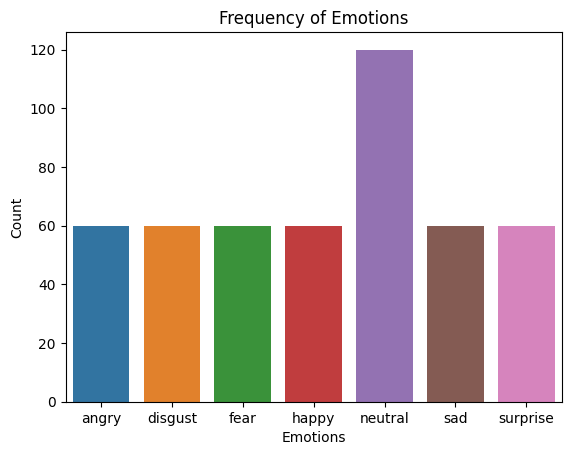

In [ ]:
#frequency of all the emotions in the dataset
sns.countplot(df_audio, x=df_audio.emotion)
plt.title('Frequency of Emotions')
plt.ylabel('Count')
plt.xlabel('Emotions')
plt.show()

In [ ]:
df_audio.emotion.value_counts()

neutral     120
angry        60
disgust      60
fear         60
happy        60
sad          60
surprise     60
Name: emotion, dtype: int64

Distribution of all the emotions except neutral is constant.
Thus, the dataset is imbalanced with more instances of neutral emotion. 

#### Manual Audio Analysis
Let's listen to some audio data samples to get the sense of the data we are dealing with.

In [ ]:
file_path = np.array(df_audio.iloc[5])[1]
Audio(file_path)

In [ ]:
file_path = np.array(df_audio.iloc[17])[1]
Audio(file_path)

In [ ]:
file_path = np.array(df_audio.iloc[50])[1]
Audio(file_path)

We can observe that 
* the size of the audio is about few seconds (2-5s)
* the voices are clear
* no background noise was present
* there is milliseconds of redundant silence at the end of the audio

Since the size of the audio samples isn't too large, it is enough to capture the one emotion and we need not worry about change in the emotional state over the conversation.



#### Analysis of Audio waveplot

In [ ]:
#reference : https://importchris.medium.com/how-to-create-understand-mel-spectrograms-ff7634991056

def create_waveplot(data, sr, emo):
    '''
      creates waveplot from the data for the given sampling rate.
    '''
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(emo), size=15)
    librosa.display.waveshow(data, sr=sr)
    plt.ylabel('amplitude')
    plt.show()

def create_spectrogram(data, sr, emo, freq='hz'):
    '''
      creates spectrogram from the data for the given sampling rate.
      function = ['hz','log']
      output contains a spectrogram with 
                    the horizontal axis representing time,
                    the vertical axis represents frequency, 
                    and the color intensity represents the amplitude of a frequency at a certain point in time.
    '''
    #stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(10, 3))
    plt.title('Audio Spectrogram with {} emotion [ {} ]'.format(emo, freq), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis=freq)   
    plt.colorbar(label='amplitude of frequency')
    plt.show()

def create_mel_spectrogram(data, sr, emo):
    '''
      creates mel-spectogram, which is perceptually relevant amplitude and frequency representation.
    '''
    mel_signal = librosa.feature.melspectrogram(y=data, sr=sr)
    spectrogram = np.abs(mel_signal)
    power_to_db = librosa.power_to_db(spectrogram, ref=np.max)
    plt.figure(figsize=(10, 3))
    librosa.display.specshow(power_to_db, sr=sr, x_axis='time', y_axis='mel', cmap='magma')
    plt.colorbar(label='dB')
    plt.title('Mel-Spectrogram (dB) for {} emotion'.format(emo), fontdict=dict(size=18))
    plt.xlabel('Time', fontdict=dict(size=15))

def plots_for_emotion(emotion):
  '''
    creates waveplot and spectogram for the mentioned emotion on our dataset
  '''
  select_instance = 1
  path = np.array(df_audio.path[df_audio.emotion==emotion])[select_instance]
  data, sampling_rate = librosa.load(path)
  create_waveplot(data, sampling_rate, emotion)
  create_spectrogram(data, sampling_rate, emotion,'hz')
  create_mel_spectrogram(data, sampling_rate, emotion)
  return Audio(path)

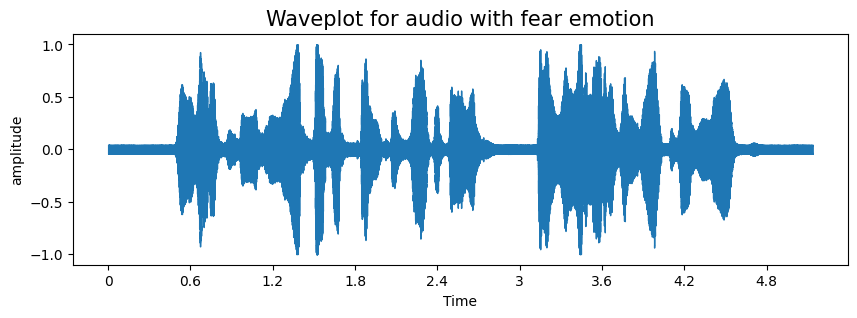

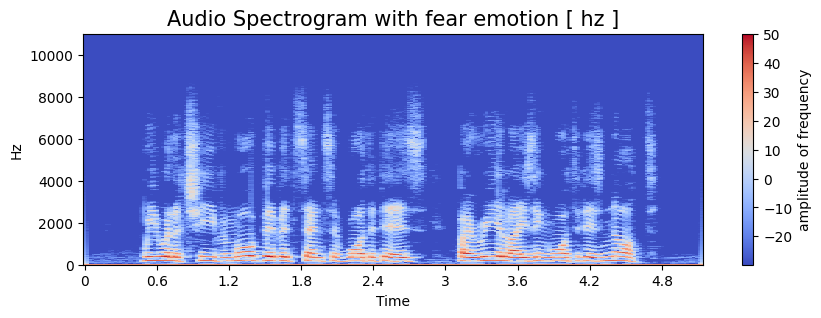

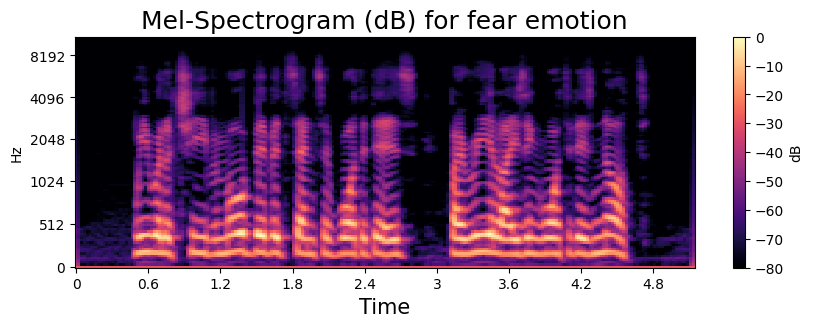

In [ ]:
plots_for_emotion('fear')

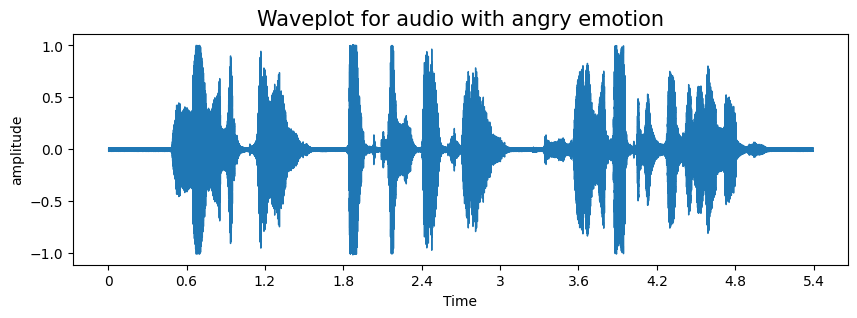

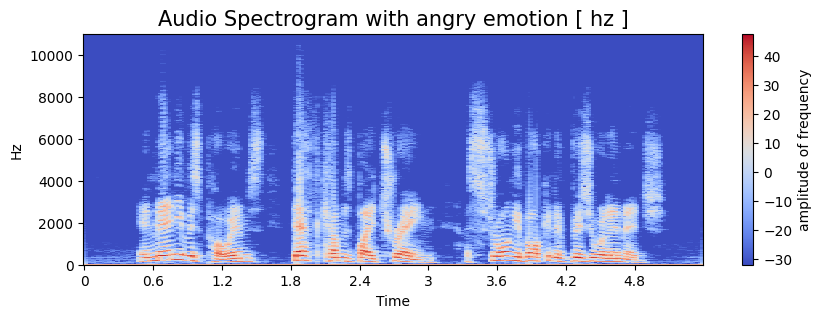

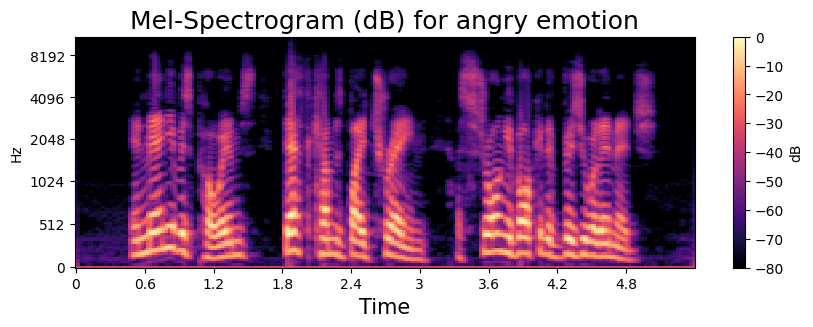

In [ ]:
plots_for_emotion('angry')

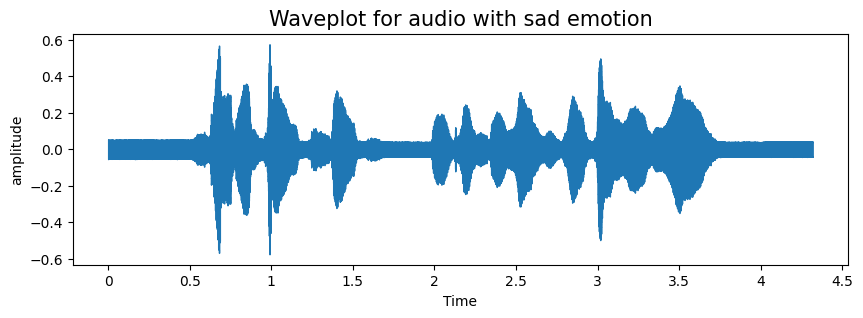

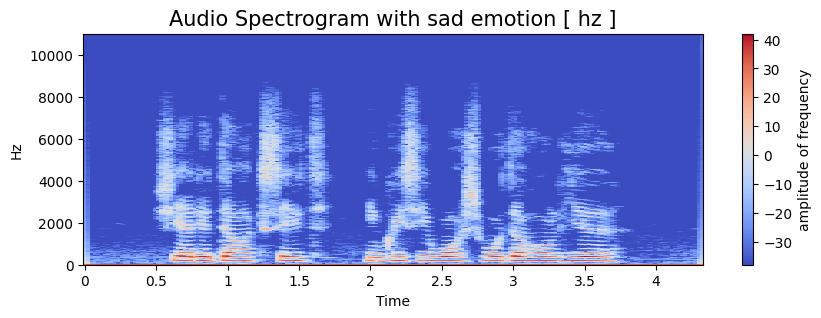

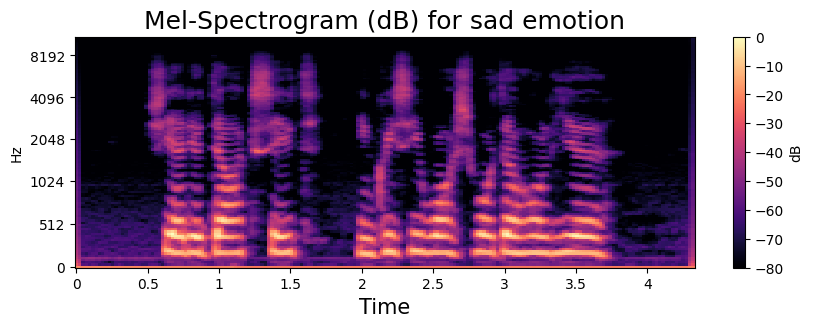

In [ ]:
plots_for_emotion('sad')

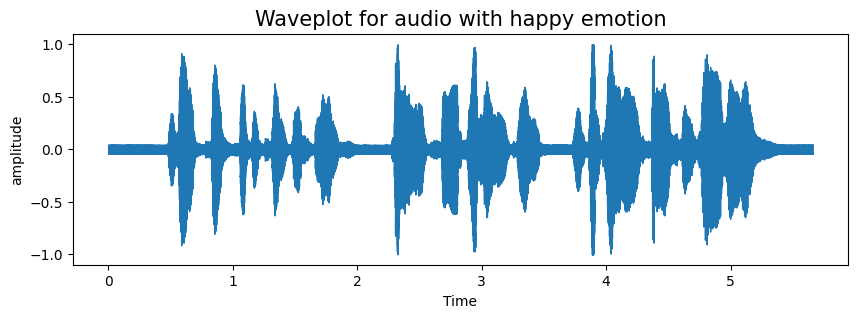

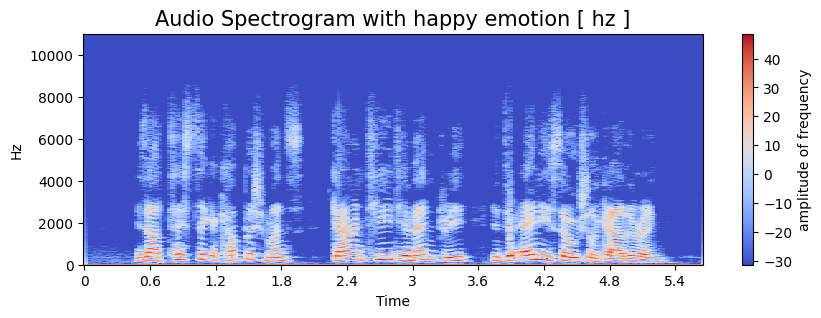

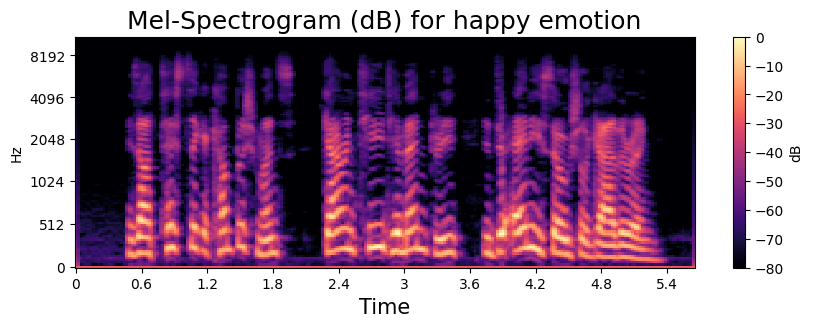

In [ ]:
plots_for_emotion('happy')

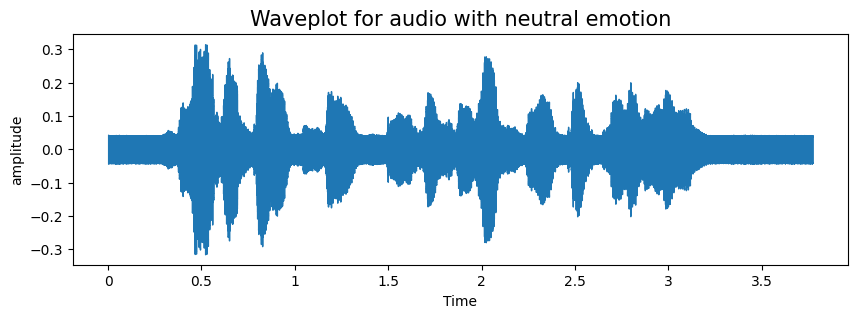

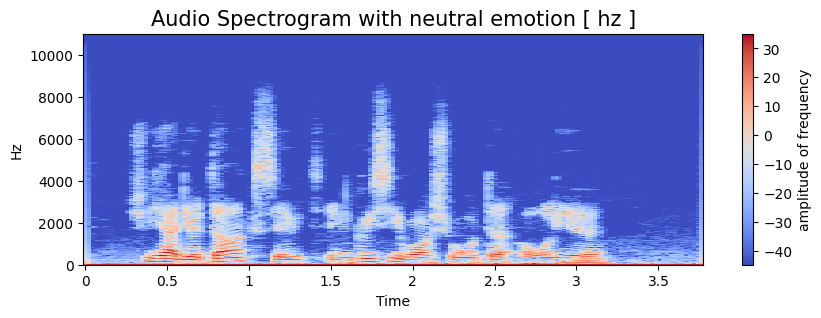

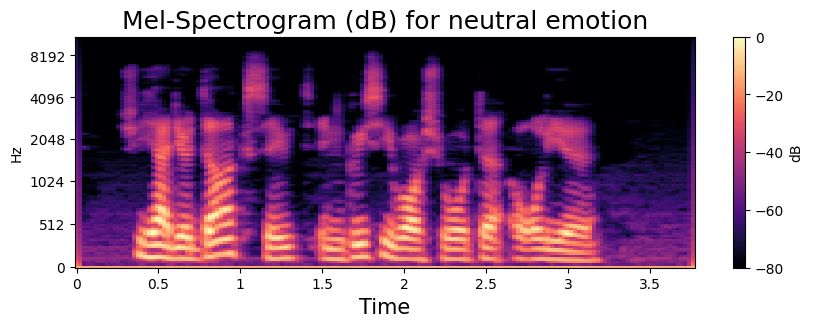

In [ ]:
plots_for_emotion('neutral')

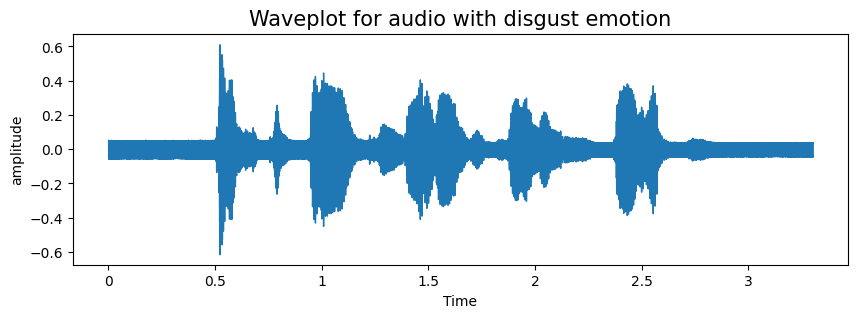

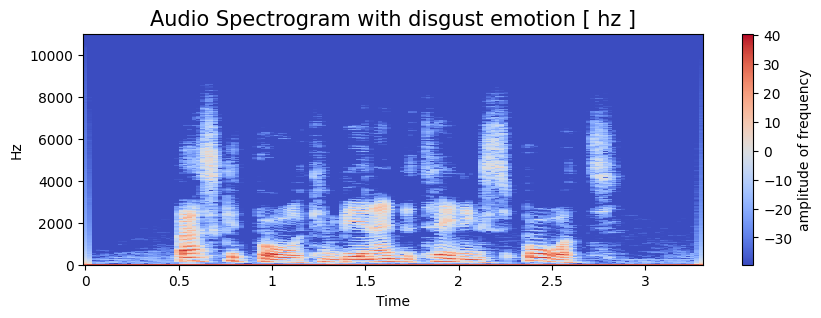

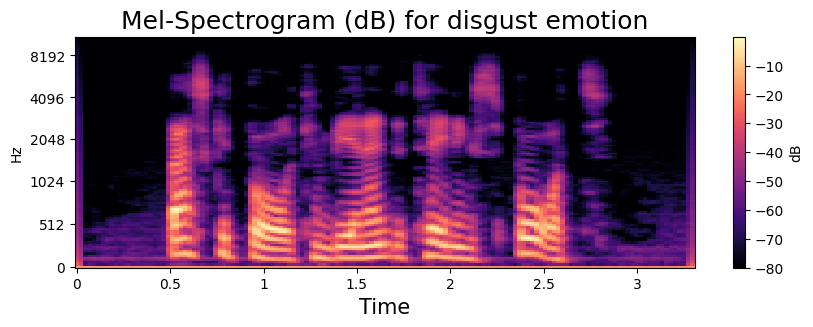

In [ ]:
plots_for_emotion('disgust')

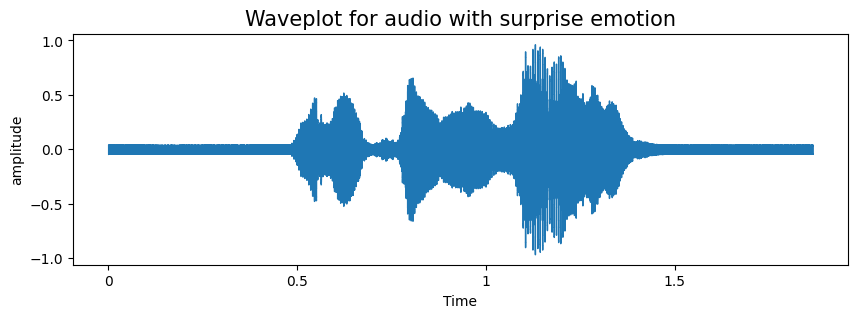

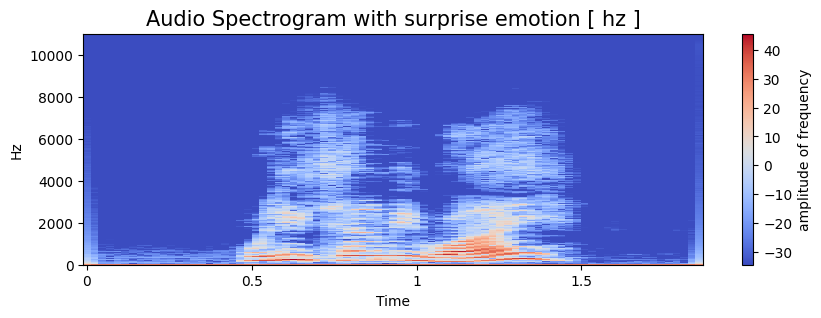

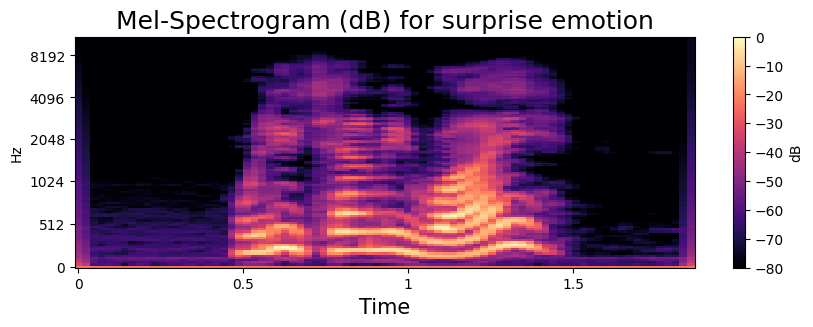

In [ ]:
plots_for_emotion('surprise')

#### Augmenting the Audio Data

1. Adding Noise
2. Stretching
3. Shifting
4. Pitch

In [ ]:
#helper functions to augment the audio
def noise(data):
    '''
      adds uniform noise to the data
    '''
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, srate=0.8):
    '''
      slows down audio without changing the pitch
    '''
    return le.time_stretch(data, rate=srate)

def shift(data):
    '''
      audio is randomly shifted left or right
    '''
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    '''
      shifts the pitch of the audio by pitch_factor
    '''
    return le.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

Let's apply the above technqiues to a sample audio and observe the result.

In [ ]:
def plot_waveform(data, sample_rate):
  '''
    outputs waveform for the given audio
  '''
  plt.figure(figsize=(10,3))
  plt.title("Waveform of audio")
  librosa.display.waveshow(y=data, sr=sample_rate)
  plt.ylabel('amplitude')
  plt.show()

#selecting random sample to check the result of the above techniques
path = np.array(df_audio.path)[1]
data, sample_rate = librosa.load(path)

##### Original Audio

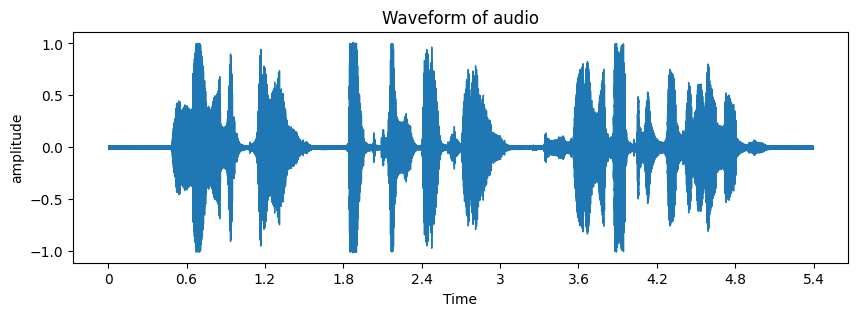

In [ ]:
plot_waveform(data,sample_rate)
Audio(data, rate=sample_rate)

##### Audio + Noise
We can observe uniform distribution of noise added to the original audio waveform.

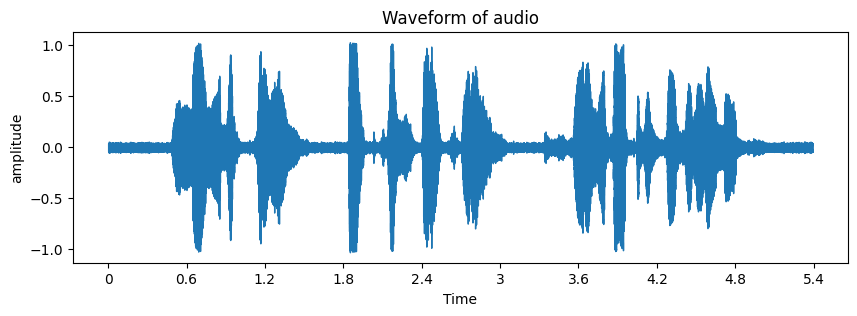

In [ ]:
x = noise(data)
plot_waveform(x,sample_rate)
Audio(x, rate=sample_rate)

##### Stretching the original audio
We can observe that original waveform of 5s has been stretched to 6s. 

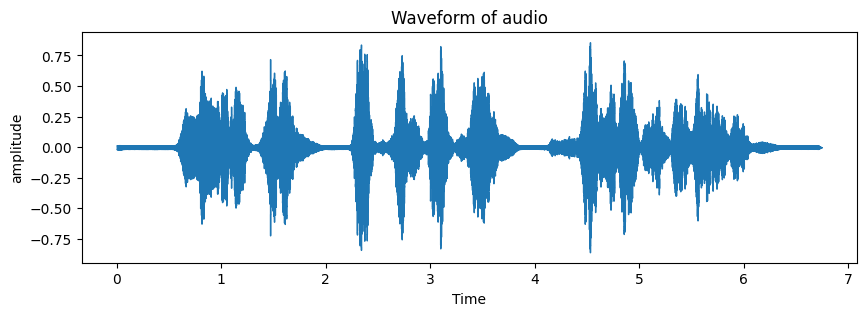

In [ ]:
x = stretch(data)
plot_waveform(x,sample_rate)
Audio(x, rate=sample_rate)

##### Shifting the original audio
The waveform is shifted to by observing the timestamps. The first peak in the original audio (is after 0.6s) is shifted before 0.6s.

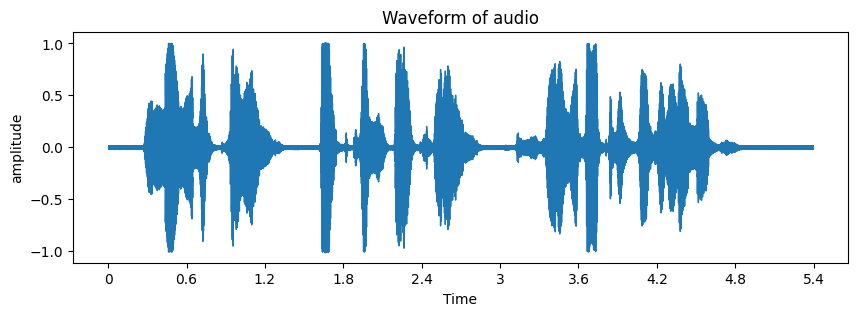

In [ ]:
x = shift(data)
plot_waveform(x,sample_rate )
Audio(x, rate=sample_rate)

##### Pitching the original audio
Pitch (i.e. frequency) is shown by the spacing of the waves in waveform. High pitch sounds have spacing close to each other.

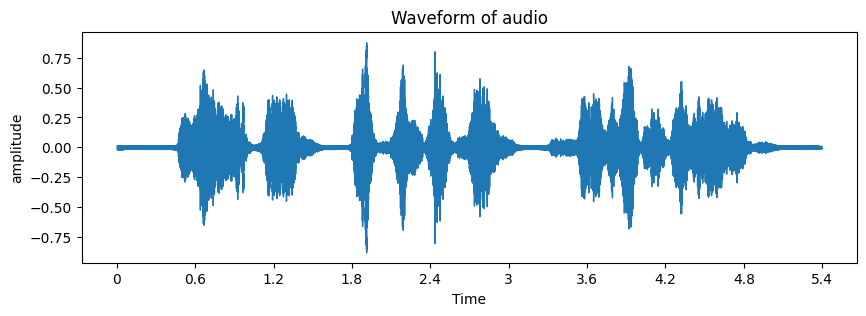

In [ ]:
x = pitch(data, sample_rate)
plot_waveform(x,sample_rate )
Audio(x, rate=sample_rate)

### Feature Extraction

* The extract_features function used here does feature extraction methods such as Zero Crossing Rate, Chroma STFT, MFCC, Root Mean Square Value, Mel Spectrogram, Spectral Centroid, Spectral Flux, MLER, Chroma Cens, and Spectral Roll Off. 

* These extracted features are concatenated horizontally to form a feature vector that is returned by the function.

* Then augmentation techniques are applied such as adding noise, stretching, and pitching to the audio data, and extracts features from the augmented data as well. Finally, it concatenates all the extracted features vertically to form a feature matrix, where each row represents a feature vector extracted from the original or augmented audio data.

In [ ]:
def mler(rms):
    '''
     mler function is used to quantify the energy level of an audio signal relative to a set threshold value
    '''
    lef=0
    delta=0.06
    lowthresh=rms.mean()*delta
    for val in rms:
        lef+=np.sign(lowthresh-val)+1
    mler=lef/len(rms)
    return mler

def extract_features(data):
    '''
      this function extracts following features from the audio data
      - zcr
      - chroma stft
      - mfcc
      - rmse
      - mel spectogram mean
      - spectral centroid
      - spectral flux
      - chroma_cens
      - spectral roll off
    '''

    # ZCR
    result = np.array([])
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result=np.hstack((result, zcr)) # stacking horizontally

    # Chroma_stft
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft)) # stacking horizontally

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc)) # stacking horizontally

    # Root Mean Square energy
    #computes the root-mean-square (RMS) energy for each frame in an audio signal. 
    #The RMS energy is a measure of the overall energy of a signal over a certain time interval. 
    #By analyzing the RMS energy over time, it is possible to detect changes in the overall energy of the signal, 
    #which can be used to identify different events or sections within the audio.
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms)) # stacking horizontally

    # MelSpectogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel)) # stacking horizontally

    # spectral centroid
    spec_cent=np.mean(librosa.feature.spectral_centroid(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, spec_cent)) # stacking horizontally
    
    # spectral flux
    onset_env =np.mean( librosa.onset.onset_strength(sr=sample_rate, S=librosa.amplitude_to_db(data, ref=np.max)))
    result=np.hstack((result,onset_env))
    
    # mler
    Mler=mler(rms)
    result=np.hstack((result,Mler))

    # chroma_cens
    chroma_cens = np.mean(librosa.feature.chroma_cens(y=data, sr=sample_rate))
    result=np.hstack((result,chroma_cens))

    # spectral roll off
    spec_rolloff = np.mean(librosa.feature.spectral_rolloff(y=x, sr=sample_rate)[0])
    result=np.hstack((result,spec_rolloff))
    return result
    
def get_features(path):
    '''
      applying augmentation to the audio data
    '''
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
    
    # original audio, without augmentation
    res1 = extract_features(data)
    result = np.array(res1)
    
    # data with noise
    noise_data = noise(data)
    res2 = extract_features(noise_data)
    result = np.vstack((result, res2)) # stacking vertically
    
    # data with stretching and pitching
    new_data = stretch(data)
    data_stretch_pitch = pitch(new_data, sample_rate)
    res3 = extract_features(data_stretch_pitch)
    result = np.vstack((result, res3)) # stacking vertically

    shifted_data = shift(data)
    
    return result

In [ ]:
if not os.path.isfile(out_loc+'/features.csv') : 
  X, Y, Z = [], [], []
  for path, emotion in zip(df_audio.path, df_audio.emotion):
      feature = get_features(path)
      # appending emotion 3 times for 3 augmentation techniques on each audio file
      for ele in feature:
          X.append(ele)
          Y.append(emotion)
          Z.append(path)

  print("Original data size : " ,df_audio.path.shape[0]) 
  print('Augment data size  : ', len(X)) 

  # creating dataframe from extracted features
  df_features = pd.DataFrame(X)
  df_features['labels'] = Y
  df_features['path'] = Z
  df_features.to_csv(out_loc+'/features.csv', index=False)

Original data size :  480
Augment data size  :  1440


In [ ]:
df_features = pd.read_csv(out_loc+'/features.csv')
df_features.head()

,0,1,2,3,4,5,6,7,8,9,...,159,160,161,162,163,164,165,166,labels,path
0,0.038891,0.470762,0.580041,0.556164,0.485299,0.460506,0.484227,0.506228,0.460546,0.536092,...,8.815924e-07,6.204377e-07,1.810696e-07,1089.103217,1.202411,0.0,0.264504,2229.79553,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
1,0.049972,0.534556,0.638407,0.616360,0.548020,0.529101,0.529090,0.536426,0.509105,0.581844,...,8.951186e-03,8.989252e-03,8.599463e-03,2432.553803,1.703041,0.0,0.265021,2229.79553,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
2,0.035981,0.337878,0.434007,0.576605,0.553203,0.446100,0.431478,0.449760,0.458095,0.448226,...,5.046651e-07,3.296962e-07,6.456352e-08,1067.668254,1.316312,0.0,0.251318,2229.79553,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
3,0.047526,0.563216,0.505528,0.479603,0.520932,0.543328,0.528193,0.453800,0.401107,0.473133,...,1.039965e-05,7.522680e-06,1.543892e-06,1208.092911,1.282680,0.0,0.259929,2229.79553,angry,/content/drive/MyDrive/Data/surrey-audiovisual...
4,0.226608,0.667310,0.646961,0.643183,0.702365,0.703781,0.637191,0.544118,0.534283,0.622352,...,7.246574e-02,7.570519e-02,7.419058e-02,3782.377461,3.415395,0.0,0.266645,2229.79553,angry,/content/drive/MyDrive/Data/surrey-audiovisual...


In [ ]:
df_features.shape

(1440, 169)

We are 1440 observations after applying augmentation techniques to our data set of size 480. We extracted total 169 features from the audio files that will be used to build our model.

### Preparing Data for Modeling

In [ ]:
#preparing data for partitioning
X = df_features.iloc[: ,:-2] #features
Y = df_features['labels'] #target
Y1 = df_features[['labels', 'path']] #target, path

#random state for train-test split
random_tts=11

##### Data-1 (with random distribution of classes)

In [ ]:
#spliting our data into train-test sets (without stratification)
x_train, x_test, y_train1, y_test1 = train_test_split(X, Y1, random_state=random_tts, test_size=0.1)
x_train, x_val, y_train1, y_val = train_test_split(x_train, y_train1, random_state=random_tts, test_size=0.1)

print("Train set : ", x_train.shape, y_train1.shape) 
print("Valdiation set: " , x_val.shape, y_val.shape)
print("Test set: ",  x_test.shape, y_test1.shape)

Train set :  (1166, 167) (1166, 2)
Valdiation set:  (130, 167) (130, 2)
Test set:  (144, 167) (144, 2)


We have 1296 instances for training and 144 instances of audio for testing our model. <br> We will further divide train set to train (1166) + validation set (130).

In [ ]:
y_train1['labels'].value_counts()

neutral     300
angry       152
happy       145
fear        144
surprise    143
sad         141
disgust     141
Name: labels, dtype: int64

In [ ]:
y_val['labels'].value_counts()

disgust     23
neutral     22
sad         20
fear        20
surprise    16
happy       15
angry       14
Name: labels, dtype: int64

In [ ]:
y_test1['labels'].value_counts()

neutral     38
surprise    21
happy       20
sad         19
disgust     16
fear        16
angry       14
Name: labels, dtype: int64

From the frequency of emotions in all the sets, you can observe original distribution of emotions is not maintained i.e. class label is distributed randomly across every set. 

Now, we can observe that our target variable "Emotions" 
contains non-numeric values. So we need to encode these values for our model to understand.

In [ ]:
#Encoding our target variable
encoder = OneHotEncoder()
y_train = encoder.fit_transform(np.array(y_train1['labels']).reshape(-1,1)).toarray()
y_val = encoder.transform(np.array(y_val['labels']).reshape(-1,1)).toarray()
y_test = encoder.transform(np.array(y_test1['labels']).reshape(-1,1)).toarray()

#Encoding target variable
#encoder = LabelEncoder()
#y_train = encoder.fit_transform(np.array(y_train1[:,0]).reshape(-1,1))
#y_test = encoder.transform(np.array(y_test1[:,0]).reshape(-1,1))

#Normalizing numeric values
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_val = scaler.transform(x_val)
x_test = scaler.transform(x_test)

print("Train set : ", x_train.shape, y_train1.shape) 
print("Valdiation set: " , x_val.shape, y_val.shape)
print("Test set: ",  x_test.shape, y_test1.shape)

Train set :  (1166, 167) (1166, 2)
Valdiation set:  (130, 167) (130, 7)
Test set:  (144, 167) (144, 2)


In [ ]:
#Adding extra dimension for 1D CNN
#3rd dimension will be set to 1 
x_train = np.expand_dims(x_train, axis=2)
x_val = np.expand_dims(x_val, axis=2)
x_test = np.expand_dims(x_test, axis=2)

print("Train set : ", x_train.shape) 
print("Valdiation set: " , x_val.shape)
print("Test set: ",  x_test.shape)

Train set :  (1166, 167, 1)
Valdiation set:  (130, 167, 1)
Test set:  (144, 167, 1)


##### Data-2 (with stratification)

In [ ]:
#spliting our data into train-test sets (with stratification)
x_train2, x_test2, y_train2, y_test2 = train_test_split(X, Y1, random_state=random_tts, stratify=Y,test_size=0.1)
x_train2, x_val2, y_train2, y_val2 = train_test_split(x_train2, y_train2, random_state=random_tts, test_size=0.1, stratify=y_train2['labels'])

print("Train set : ", x_train2.shape, y_train2.shape) 
print("Valdiation set: " , x_val2.shape, y_val2.shape)
print("Test set: ",  x_test2.shape, y_test2.shape)

Train set :  (1166, 167) (1166, 2)
Valdiation set:  (130, 167) (130, 2)
Test set:  (144, 167) (144, 2)


After applying stratification to ensure similar distribution of target variables with respect to original dataset, we get 1166 samples as train set, 130 samples for validation and 144 samples for test set. 

In [ ]:
y_train2['labels'].value_counts()

neutral     291
fear        146
surprise    146
angry       146
happy       146
sad         146
disgust     145
Name: labels, dtype: int64

In [ ]:
y_val2['labels'].value_counts()

neutral     33
disgust     17
surprise    16
happy       16
angry       16
sad         16
fear        16
Name: labels, dtype: int64

In [ ]:
y_test2['labels'].value_counts()

neutral     36
fear        18
sad         18
happy       18
surprise    18
disgust     18
angry       18
Name: labels, dtype: int64

Here you can notice that the partition contains same distribution of emotions as the original dataset.

In [ ]:
#Encoding our target variable
encoder = OneHotEncoder()
y_train2 = encoder.fit_transform(np.array(y_train2['labels']).reshape(-1,1)).toarray()
y_val2 = encoder.transform(np.array(y_val2['labels']).reshape(-1,1)).toarray()
y_test2 = encoder.transform(np.array(y_test2['labels']).reshape(-1,1)).toarray()

#Normalizing numeric values
scaler = StandardScaler()
x_train2 = scaler.fit_transform(x_train2)
x_val2 = scaler.transform(x_val2)
x_test2 = scaler.transform(x_test2)

#Adding extra dimension for 1D CNN
#3rd dimension will be set to 1 
x_train2 = np.expand_dims(x_train2, axis=2)
x_val2 = np.expand_dims(x_val2, axis=2)
x_test2 = np.expand_dims(x_test2, axis=2)

print("Train set : ", x_train2.shape, y_train2.shape) 
print("Valdiation set: " , x_val2.shape, y_val2.shape)
print("Test set: ",  x_test2.shape, y_test2.shape)

Train set :  (1166, 167, 1) (1166, 7)
Valdiation set:  (130, 167, 1) (130, 7)
Test set:  (144, 167, 1) (144, 7)


### CNN (1D) Model

RNN are most widely used for speech recognition. But even CNN networks have shown to outperform RNN in many cases. Thus, we are experimenting with CNN for our data. 

In [ ]:
def create_model (x_train) :  
  model=Sequential()

  #layer1
  model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', input_shape=(x_train.shape[1], 1)))
  model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

  #layer2
  model.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu'))
  model.add(MaxPooling1D(pool_siåze=5, strides = 2, padding = 'same'))

  #layer3
  model.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu'))
  model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))
  model.add(Dropout(0.2))

  #layer4
  model.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
  model.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

  model.add(Flatten())
  model.add(Dense(units=32, activation='relu'))
  model.add(Dropout(0.3))

  model.add(Dense(units=7, activation='softmax'))
  model.compile(optimizer = 'adam' , loss = 'categorical_crossentropy' , metrics = ['accuracy'])

  return model 

* This code is defining a neural network model using the Keras API.

* The model architecture is a Convolutional Neural Network (CNN) with four convolutional layers, each followed by a max pooling layer. The convolutional layers use a kernel size of 5 and stride of 1, with 'same' padding to preserve the input shape. The activation function used is ReLU.

* After the convolutional layers, there is a dropout layer to prevent overfitting. The flattened output is then passed through a fully connected dense layer with 32 units and ReLU activation function. Another dropout layer follows before the final output layer with 7 units and softmax activation function. The optimizer used is Adam, with categorical cross-entropy loss function and accuracy as the evaluation metric.

##### Training the model using Data-1

In [ ]:
model = create_model(x_train) 
model.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_68 (Conv1D)          (None, 167, 256)          1536      
                                                                 
 max_pooling1d_68 (MaxPoolin  (None, 84, 256)          0         
 g1D)                                                            
                                                                 
 conv1d_69 (Conv1D)          (None, 84, 256)           327936    
                                                                 
 max_pooling1d_69 (MaxPoolin  (None, 42, 256)          0         
 g1D)                                                            
                                                                 
 conv1d_70 (Conv1D)          (None, 42, 128)           163968    
                                                                 
 max_pooling1d_70 (MaxPoolin  (None, 21, 128)        

In [ ]:
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
history=model.fit(x_train, y_train, batch_size=64, epochs=50, validation_data=(x_val, y_val), callbacks=[rlrp])
model.save(out_loc+'/models/audioAnalysisData1.h5')

Epoch 1/50
19/19 [==============================] - 3s 28ms/step - loss: 1.8733 - accuracy: 0.2847 - val_loss: 1.8747 - val_accuracy: 0.2538 - lr: 0.0010
Epoch 2/50
19/19 [==============================] - 0s 13ms/step - loss: 1.7687 - accuracy: 0.3336 - val_loss: 1.7941 - val_accuracy: 0.2308 - lr: 0.0010
Epoch 3/50
19/19 [==============================] - 0s 12ms/step - loss: 1.6717 - accuracy: 0.3525 - val_loss: 1.7263 - val_accuracy: 0.3154 - lr: 0.0010
Epoch 4/50
19/19 [==============================] - 0s 12ms/step - loss: 1.6264 - accuracy: 0.3722 - val_loss: 1.6665 - val_accuracy: 0.3000 - lr: 0.0010
Epoch 5/50
19/19 [==============================] - 0s 12ms/step - loss: 1.5733 - accuracy: 0.3954 - val_loss: 1.6293 - val_accuracy: 0.3154 - lr: 0.0010
Epoch 6/50
19/19 [==============================] - 0s 12ms/step - loss: 1.5010 - accuracy: 0.3945 - val_loss: 1.5456 - val_accuracy: 0.3538 - lr: 0.0010
Epoch 7/50
19/19 [==============================] - 0s 12ms/step - loss: 1.4

###### Model Evaluation (Data-1)

**Training & Validation Loss & Accuracy**

* The below code generates two subplots side by side, each with two lines: one for training loss/accuracy and the other for validation loss/accuracy, plotted against the number of epochs. The x-axis represents the number of epochs (training iterations), and the y-axis represents the value of the metric (either loss or accuracy). The blue lines represent the training data, while the orange lines represent the validation data.

* The purpose of plotting the training and validation loss is to check if the model is overfitting or underfitting.

* Similarly, plotting the training and validation accuracy is important to check if the model is overfitting or underfitting. If the training accuracy is increasing while the validation accuracy is decreasing, then it means that the model is overfitting and not generalizing well to unseen data. If both the training and validation accuracy are increasing and converge to a similar value, then it means that the model is learning well and generalizing to unseen data.

In [ ]:
def evaluate_result(model):

  epochs = [i for i in range(50)]
  fig , ax = plt.subplots(1,2)
  train_acc = history.history['accuracy']
  train_loss = history.history['loss']
  val_acc = history.history['val_accuracy']
  val_loss = history.history['val_loss']

  fig.set_size_inches(20,6)
  ax[0].plot(epochs , train_loss , label = 'Training Loss')
  ax[0].plot(epochs , val_loss , label = 'Validation Loss')
  ax[0].set_title('Training & Validation Loss')
  ax[0].legend()
  ax[0].set_xlabel("Epochs")

  ax[1].plot(epochs , train_acc , label = 'Training Accuracy')
  ax[1].plot(epochs , val_acc , label = 'Validation Accuracy')
  ax[1].set_title('Training & Validation Accuracy')
  ax[1].legend()
  ax[1].set_xlabel("Epochs")
  plt.show()

**Confusion Matrix**
* The code below is used to plot a confusion matrix to evaluate the performance of the classification model.

* First, the confusion matrix is computed using the confusion_matrix function from scikit-learn, which takes the true labels (y_test) and predicted labels (y_pred) as inputs. The resulting confusion matrix is then converted into a pandas DataFrame with rows and columns labeled according to the categories in the encoder object (encoder.categories_).

* Next, a heatmap is plotted using the seaborn library's heatmap function, which takes the confusion matrix DataFrame as input. 

In [ ]:
def generate_confusion_matrix(y_test, y_pred):
  labels=[l for l in encoder.categories_[0]]
  cf_matrix = confusion_matrix(y_test,y_pred)
  cm = pd.DataFrame(cf_matrix , index = [i for i in labels] , columns = [i for i in labels])
  ax = sns.heatmap(cm, annot=True, cmap='Blues', fmt="d")
  ax.set_title('Confusion Matrix');
  ax.set_xlabel('Predicted Values')
  ax.set_ylabel('Actual Values ')
  plt.show()

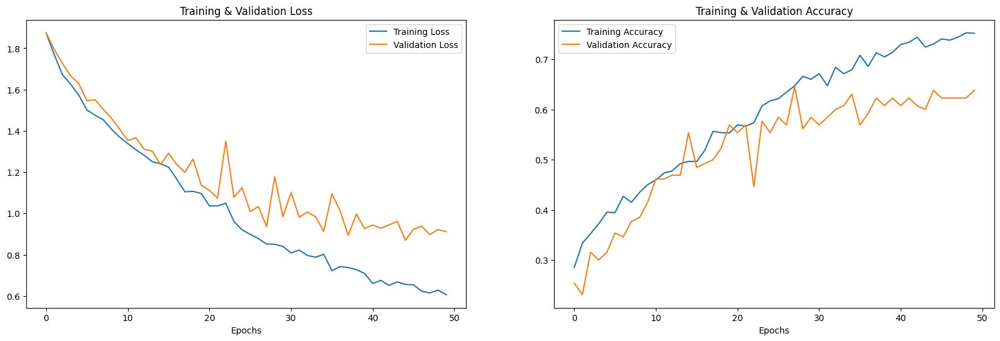

In [ ]:
evaluate_result(model)

We can observe that training and validation accuracies are increasing as epoch increases and thus our first model is learning well and generalizing to unseen data. 

Evaluate Result on Train Set

In [ ]:
print("Accuracy of our model on train data : " , model.evaluate(x_train,y_train)[1]*100 , "%")

37/37 [==============================] - 0s 5ms/step - loss: 0.4531 - accuracy: 0.8482
Accuracy of our model on train data :  84.819895029068 %


Evaluate Result on Test Set

In [ ]:
print("Accuracy of our model on test data : " , model.evaluate(x_test,y_test)[1]*100 , "%")

5/5 [==============================] - 0s 6ms/step - loss: 0.9312 - accuracy: 0.6389
Accuracy of our model on test data :  63.88888955116272 %


We can observe that our train set accuracy is good but test set accuracy is comparatively not good enough. This could be due to uneven distribution of all the targets. 

Classification Report

In [ ]:
pred_test = model.predict(x_test)
y_pred = encoder.inverse_transform(pred_test)
y_test = encoder.inverse_transform(y_test)

print(classification_report(y_test, y_pred))

5/5 [==============================] - 0s 4ms/step
              precision    recall  f1-score   support

       angry       0.53      0.64      0.58        14
     disgust       0.65      0.69      0.67        16
        fear       0.38      0.31      0.34        16
       happy       0.42      0.50      0.45        20
     neutral       0.81      0.92      0.86        38
         sad       0.86      0.63      0.73        19
    surprise       0.62      0.48      0.54        21

    accuracy                           0.64       144
   macro avg       0.61      0.60      0.60       144
weighted avg       0.64      0.64      0.63       144



Confusion Matrix

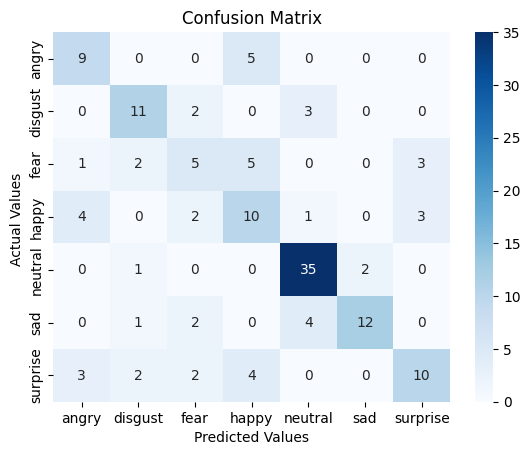

In [ ]:
generate_confusion_matrix(y_test, y_pred)

In [ ]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels', 'Path'])
df['Predicted Labels'] = y_pred.flatten()
df['Actual Labels'] = y_test.flatten()
df['Path'] = list(y_test1['path'])
df.to_csv(out_loc + '/Audio_analysis_predictions-1.csv')  

##### Training the model using Data-2

In [ ]:
#creating model and training it on data-2
model2 = create_model(x_train2) 
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0000001)
history=model2.fit(x_train2, y_train2, batch_size=64, epochs=50, validation_data=(x_val2, y_val2), callbacks=[rlrp])
model2.save(out_loc+'/models/audioAnalysisData2.h5')

Epoch 1/50
19/19 [==============================] - 3s 27ms/step - loss: 1.8594 - accuracy: 0.2753 - val_loss: 1.7635 - val_accuracy: 0.2846 - lr: 0.0010
Epoch 2/50
19/19 [==============================] - 0s 13ms/step - loss: 1.7401 - accuracy: 0.3268 - val_loss: 1.6280 - val_accuracy: 0.3538 - lr: 0.0010
Epoch 3/50
19/19 [==============================] - 0s 12ms/step - loss: 1.6485 - accuracy: 0.3491 - val_loss: 1.5602 - val_accuracy: 0.4000 - lr: 0.0010
Epoch 4/50
19/19 [==============================] - 0s 11ms/step - loss: 1.5964 - accuracy: 0.3722 - val_loss: 1.5063 - val_accuracy: 0.4231 - lr: 0.0010
Epoch 5/50
19/19 [==============================] - 0s 12ms/step - loss: 1.5693 - accuracy: 0.3842 - val_loss: 1.4645 - val_accuracy: 0.4462 - lr: 0.0010
Epoch 6/50
19/19 [==============================] - 0s 12ms/step - loss: 1.5140 - accuracy: 0.4074 - val_loss: 1.4375 - val_accuracy: 0.4231 - lr: 0.0010
Epoch 7/50
19/19 [==============================] - 0s 15ms/step - loss: 1.4

###### Model Evaluation (Data-2)

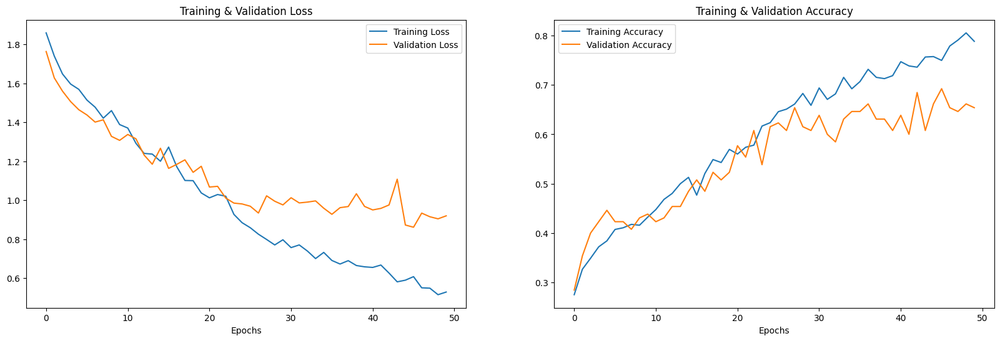

In [ ]:
evaluate_result(model2)

Evaluating result on Train set

In [ ]:
print("Accuracy of our model on train data : " , model2.evaluate(x_train2,y_train2)[1]*100 , "%")

37/37 [==============================] - 0s 10ms/step - loss: 0.3701 - accuracy: 0.8799
Accuracy of our model on train data :  87.9931390285492 %


Evaluating result on Test set

In [ ]:
print("Accuracy of our model on test data : " , model2.evaluate(x_test2,y_test2)[1]*100 , "%")

5/5 [==============================] - 0s 6ms/step - loss: 0.8352 - accuracy: 0.7292
Accuracy of our model on test data :  72.91666865348816 %


For this model, we got better performance than the previous one. Our Training Accuracy increased a bit from 84% to 87%. But there is significant improvement on unseen data, with accuracy of 72% compared to 63% initially. Thus, our new model is learning better and generalizing the unseen data well. 
<br>
<br>
We can conclude that model performs better on unseen data using stratified data. Thus, this will be our final model for further analysis.

Classification Report

In [ ]:
pred_test2 = model2.predict(x_test2)
y_pred2 = encoder.inverse_transform(pred_test2)
y_test2 = encoder.inverse_transform(y_test2)
print(classification_report(y_test2, y_pred2))

5/5 [==============================] - 0s 3ms/step
              precision    recall  f1-score   support

       angry       0.69      0.50      0.58        18
     disgust       0.59      0.72      0.65        18
        fear       0.67      0.56      0.61        18
       happy       0.67      0.78      0.72        18
     neutral       0.87      0.92      0.89        36
         sad       0.89      0.89      0.89        18
    surprise       0.59      0.56      0.57        18

    accuracy                           0.73       144
   macro avg       0.71      0.70      0.70       144
weighted avg       0.73      0.73      0.72       144



From classification report, we can observe the followong :
* Our model has the highest precision, recall, and f1-score for the "neutral" class, which indicates that the model performs well on this class. This is due to the fact that model has more number of samples available to learn neutral features as compared to rest of the emotions.
* It is surprising to see that "sad" emotion performs as good as "neutral" emotion despite having less number of samples compared to "neutral" class. Thus, we can conclude that the model is able to correctly identify the “sad” emotion even with limited data and is not biased towards “neutral” emotion.
* However, the model has lower f1-scores on some of the other classes, such as "angry" (0.57) and "surprise" (0.58). This suggests that the model may struggle with correctly identifying these emotions.
* Angry : Our model has higher recall (0.69) than precision (0.5) for the "angry" class, which suggests that it is better at identifying instances that actually belong to the "angry" class, but may also be prone to misclassifying half of the instances as "angry" that are actually not.
* Surprise : The model has a precision of 0.59 and recall of 0.56 for the "surprise" emotion, i.e. the model struggles to correctly identify instances of "surprise" emotion, both in terms of false positives and false negatives.
* Happy : Our model correctly identified 78% of instances that actually belong to the "happy" class (recall), while also predicting some instances as "happy" that were actually not (false positives), resulting in a precision of 67%. 
* Fear : Our model has higher precision(0.67) than recall for the "fear" class, which suggests that it is better at identifying instances as "fear" when it is confident in its predictions, but may miss around half of instances that actually belong to the "fear" class as the recall is 0.56.
* Disgust : Our model has higher recall than precision for the "disgust" class, which suggests that it is better at identifying instances as "disgust" but it results in some false positives.
* Our model has both high precision and recall for the "sad" class, apart from "neutral", which suggests that it is good at identifying instances that actually belong to the "sad" class & less prone to misclassification. Followed by average predictions for disgust, fear and happy emotions. However, it performs poorly for "sad" and "surprise" emotions.

Confusion Matrix

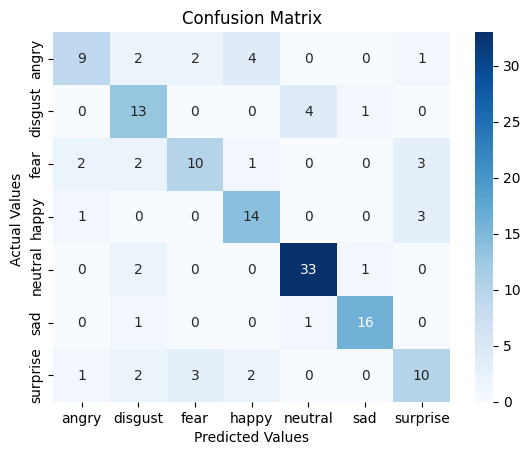

In [ ]:
generate_confusion_matrix(y_test2, y_pred2)

From the Confusion Matrix, we can observe the following :   
* Since there are more "neutral" instances to learn the trends in the data, model does good job at identifying this emotion correctly, with every few misclassification. 
* Model does a good job in identifying 16/18 "sad" instances.
* Model predicts 4/18 instances of "angry" as "happy".  It's possible that there may be some overlap in the features or patterns associated with these two emotions that is leading to confusion for the model. 
* Similary 3 instances each of "happy" and "fear" are misclassified as "surprise". These emotions have similar acoustic features, such as pitch and intensity, that might be difficult to distinguish by the model.

In [ ]:
df2 = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels', 'Path'])
df2['Predicted Labels'] = y_pred2.flatten()
df2['Actual Labels'] = y_test2.flatten()
df2['Path'] = y_test2.flatten()
df2.to_csv(out_loc + '/Audio_analysis_predictions-2.csv')  

### Extracting Sentiments through textual content of the audio files

#### Audio to Text

* The speech_to_text_new() function takes an audio file as input and converts it into text. It first opens the audio file using AudioFile() method of speech_recognition and uses r.record() method to record the audio from the source. r.recognize_google(audio_text) method uses Google Web Speech API to recognize the speech from the audio file and convert it into text.

* The filename is split to get the name of the emotion in the filename, which is then mapped to the corresponding emotion using the emotion_map dictionary. The speech_to_text_new() function is then called on the file and the resulting text, filename, and emotion are appended to the result list.

In [ ]:
r = sr.Recognizer()
r.energy_threshold = 200

#Helper method to convert speech to text using recognize google module.
def speech_to_text_new(audio_file):
  """
  Opens and listens to an audio file and translates it to text
  Args: audio file
  Returns: text of transcribed audio file
  """
  with sr.AudioFile(audio_file) as source:
    audio_text = r.record(source)
    text = ""
    try:
        text = r.recognize_google(audio_text)
        print('Converting audio transcripts into text ...')
    except Exception as exp:
         print('Sorry.. run again...', exp)

    return text

In [ ]:
if not os.path.isfile(file_loc + '/TextData.csv') : 
  #transcripting audio clips to text
  directory = Savee
  result = []
  for filename in os.listdir(directory):
      filepath = os.path.join(directory, filename)
      filename = filename.split("/")[-1]
      #print(filename + " " + emotion_map.get(filename.split('_')[1][:-6]))    
      text = speech_to_text_new(filepath)
      result.append([text, filename, emotion_map.get(filename.split('_')[1][:-6])])

  #Writing it to csv file
  with open(file_loc + '/TextData.csv', 'w', newline='') as file:
      writer = csv.writer(file)
      writer.writerow( ('text', 'file', 'label') )
      writer.writerows(result)
  print("Transcription Completed!")
else :
  print("Data is transcribed already!")

Data is transcribed already!


#### Load & Explore the data


In [ ]:
df = pd.read_csv(file_loc + '/TextData.csv')
print("Text Data loaded")

Text Data loaded


In [ ]:
df.head(10)

,text,file,label
0,should your dog suit in Greasy wash water all ...,DC_a01.wav,angry
1,and many of his poems death comes by train a s...,DC_a14.wav,angry
2,but in this one section we welcomed auditors,DC_a12.wav,angry
3,destroy every final related to my audits,DC_a05.wav,angry
4,lot of people will roam the streets and costum...,DC_a13.wav,angry
5,will you tell me why,DC_a03.wav,angry
6,don't ask me to carry an oily rag like that,DC_a02.wav,angry
7,kindergarten children decorate the classrooms ...,DC_a10.wav,angry
8,who authorized unlimited expense account,DC_a04.wav,angry
9,Korean trash played tag with Beach Boys for hours,DC_a06.wav,angry


We have used the same data set to transcribe the audio to text. Thus, we have same distribution of values.

In [ ]:
df.shape

(480, 3)

In [ ]:
df["label"].value_counts()

neutral     120
angry        60
disgust      60
fear         60
happy        60
sad          60
surprise     60
Name: label, dtype: int64

#### Word Cloud


* The following code is creating a wordcloud visualization for the words used in text labeled as "happy" and "sad".

* The code first filters the rows in the dataframe with the label "happy" and "sad" respectively, and then selects the text column for each of these labels.

* Then, a function named "wordcloud_draw" is defined which takes the selected text as input along with a color. This function first joins all the text into a single string.

* The WordCloud object is then created with this cleaned string as input, along with stopwords (words which are commonly used and do not add much meaning to the text), background color, and dimensions. Finally, the wordcloud is displayed using matplotlib.

* The function "wordcloud_draw" is called twice, once for happy words with white background color, and once for sad words.

Happy words


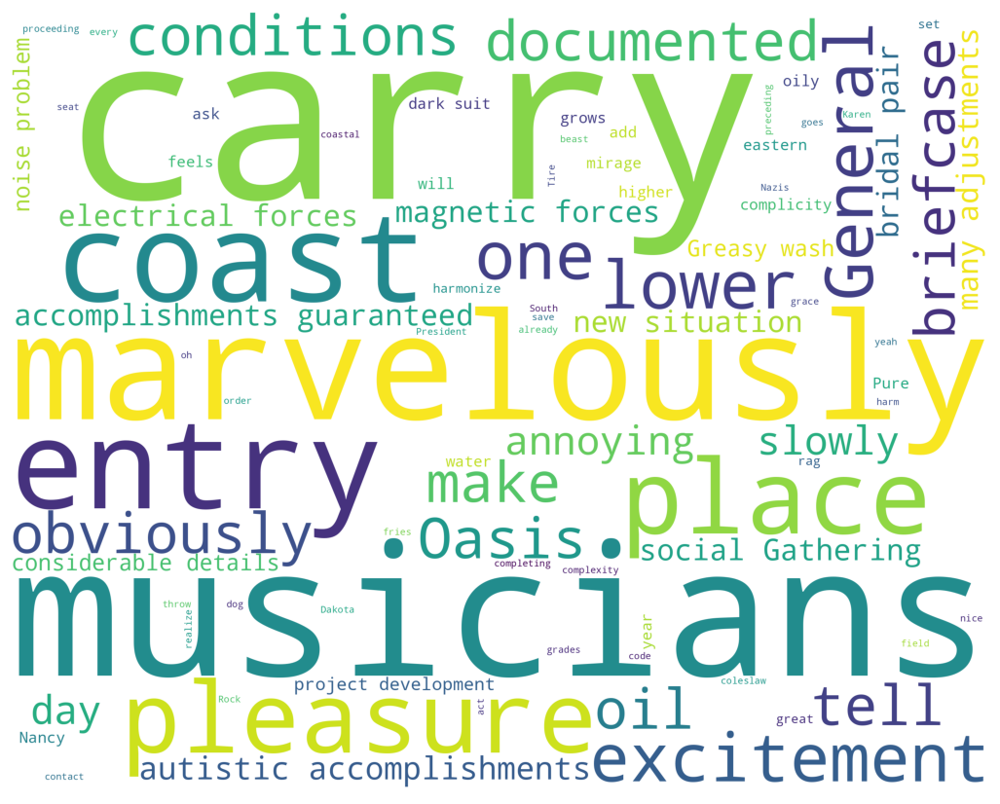

Sad words


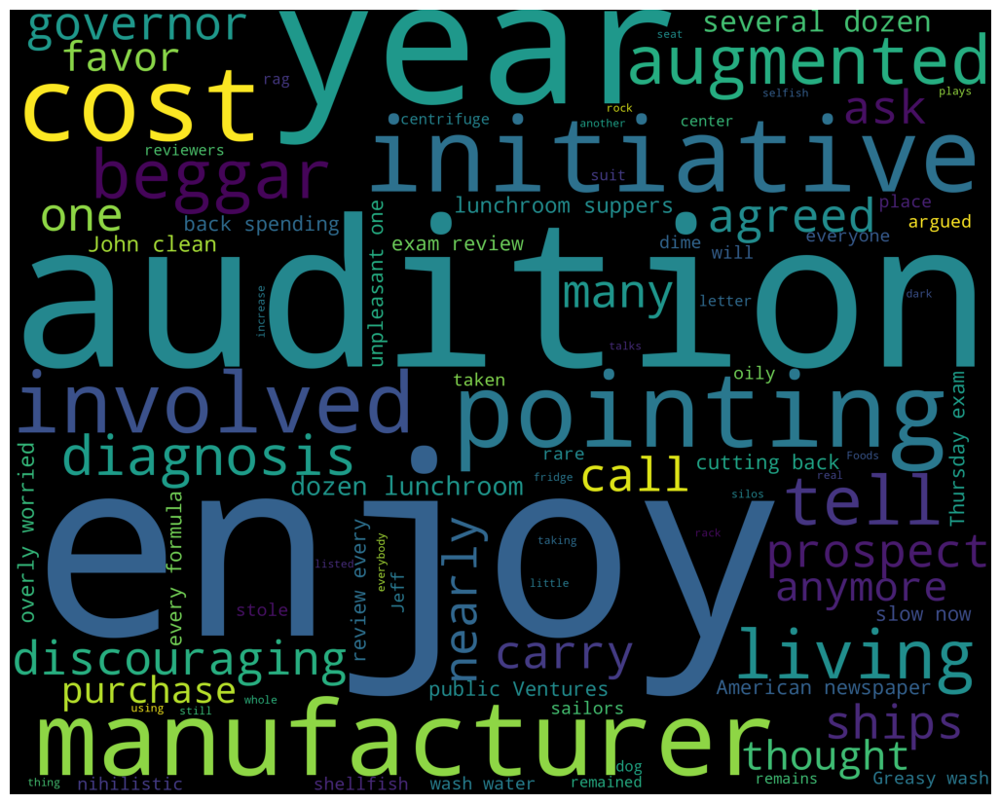

In [ ]:
happy = df[df['label']=='happy']
happy = happy['text']
sad = df[df['label']=='sad']
sad = sad['text']

def wordcloud_draw(data, color = 'black'):
    words = ' '.join(data)
    cleaned_word = " ".join([word for word in words.split()])
    wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color=color,
                      width=2500,
                      height=2000
                     ).generate(cleaned_word)
    plt.figure(1,figsize=(13, 13))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
    
    
print("Happy words")
wordcloud_draw(happy,'white')
print("Sad words")
wordcloud_draw(sad)

#### Preparing Text Data


In [ ]:
# Defining vector space dimension and fixed input size

# Number of labels: neutral, angry, happy, sad, fear, disgust, surprise.
num_classes = 7

# Number of dimensions for word embedding
embed_num_dims = 300

# Max input length (max number of words) 
max_seq_len = 500

class_names = ['neutral', 'angry', 'happy', 'sad', 'fear', 'disgust', 'surprise']


In [ ]:
# Importing our training and testing datasets
X = df.iloc[:, :-1]
y = df.iloc[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=random_tts, stratify=y, test_size=0.1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, random_state=random_tts, stratify=y_train, test_size=0.1)

print("Train set : ", X_train.shape, y_train.shape) 
print("Valdiation set: " , X_val.shape, y_val.shape)
print("Test set: ",  X_test.shape, y_test.shape)

Train set :  (388, 2) (388,)
Valdiation set:  (44, 2) (44,)
Test set:  (48, 2) (48,)


In [ ]:
data_train = pd.concat((X_train, y_train), axis=1)
data_val = pd.concat((X_val, y_val), axis=1)
data_test = pd.concat((X_test, y_test), axis=1)

data_train.head()

,text,file,label
83,did you talk safety greasy wash with all year,DC_su01.wav,surprise
0,should your dog suit in Greasy wash water all ...,DC_a01.wav,angry
181,his autistic accomplishments guaranteed him en...,JE_h12.wav,happy
127,Bob burn paper and leaves with a big bonfire,JE_d08.wav,disgust
210,project development was completing too slowly,JE_h07.wav,happy


In [ ]:
#word tokenization of text using nltk
texts = [' '.join(word_tokenize(text)) for text in df.text]
texts_train = [' '.join(word_tokenize(text)) for text in X_train.text]
texts_val = [' '.join(word_tokenize(text)) for text in X_val.text]
texts_test = [' '.join(word_tokenize(text)) for text in X_test.text]
texts_train[1:6]

['should your dog suit in Greasy wash water all year',
 "his autistic accomplishments guaranteed him entry it 's any social Gathering",
 'Bob burn paper and leaves with a big bonfire',
 'project development was completing too slowly',
 'the carpet cleaner shampoo doll oriental rug']

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(texts)

sequence_train = tokenizer.texts_to_sequences(texts_train)
sequence_val = tokenizer.texts_to_sequences(texts_val)
sequence_test = tokenizer.texts_to_sequences(texts_test)

index_of_words = tokenizer.word_index

# vocab size is number of unique words + reserved 0 index for padding
vocab_size = len(index_of_words) + 1

print('Number of unique words: {}'.format(len(index_of_words)))

Number of unique words: 664


In [ ]:
# Padding
X_train_pad = pad_sequences(sequence_train, maxlen = max_seq_len )
X_val_pad = pad_sequences(sequence_val, maxlen = max_seq_len )
X_test_pad = pad_sequences(sequence_test, maxlen = max_seq_len )

X_train_pad

array([[  0,   0,   0, ...,  57,  16,  28],
       [  0,   0,   0, ...,  38,  16,  28],
       [  0,   0,   0, ...,  66, 216, 217],
       ...,
       [  0,   0,   0, ..., 649,  16,  28],
       [  0,   0,   0, ..., 358,  16, 359],
       [  0,   0,   0, ..., 108, 365, 366]], dtype=int32)

In [ ]:
# Categorizing the labels
encoding = {
    'neutral':0,
    'angry':1,
    'happy':2,
    'sad':3,
    'fear':4,
    'disgust':5,
    'surprise':6
}

# Integer labels
y_train = [encoding[x] for x in data_train.label]
y_val = [encoding[x] for x in data_val.label]
y_test = [encoding[x] for x in data_test.label]

y_train = to_categorical(y_train)
y_val = to_categorical(y_val)
y_test = to_categorical(y_test)

y_train

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

#### Word Embedding

In [ ]:
# Importing pretrained word2vec from file and creating embedding matrix
def create_embedding_matrix(filepath, word_index, embedding_dim):
    vocab_size = len(word_index) + 1  # Adding again 1 because of reserved 0 index
    embedding_matrix = np.zeros((vocab_size, embedding_dim))
    with open(filepath,encoding='utf-8') as f:
        for line in f:
            word, *vector = line.split()
            if word in word_index:
                idx = word_index[word] 
                embedding_matrix[idx] = np.array(
                    vector, dtype=np.float32)[:embedding_dim]
    return embedding_matrix

In [ ]:
fname = 'embeddings/wiki-news-300d-1M.vec'

if not os.path.isfile(fname):
    print('Downloading word vectors...')
    urllib.request.urlretrieve('https://dl.fbaipublicfiles.com/fasttext/vectors-english/wiki-news-300d-1M.vec.zip',
                              'wiki-news-300d-1M.vec.zip')
    print('Unzipping...')
    with zipfile.ZipFile('wiki-news-300d-1M.vec.zip', 'r') as zip_ref:
        zip_ref.extractall('embeddings')
    print('done.')
    
    os.remove('wiki-news-300d-1M.vec.zip')

In [ ]:
embedd_matrix = create_embedding_matrix(fname, index_of_words, embed_num_dims)
embedd_matrix.shape

(665, 300)

#### Model : BGRU

In [ ]:
# Creating GRU Pipeline
# Embedding layer before the actaul BGRU 
embedd_layer = Embedding(vocab_size,
                         embed_num_dims,
                         input_length = max_seq_len,
                         weights = [embedd_matrix],
                         trainable=False)

In [ ]:
# Model Pipeline

# Parameters
gru_output_size = 128

# Embedding Layer, GRU or biBRU, Dense, softmax
model = Sequential()
model.add(embedd_layer)
model.add(Bidirectional(GRU(units=gru_output_size,
                          dropout=0.2,
                          recurrent_dropout=0.2)))
model.add(Dense(num_classes, activation='softmax'))

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
model.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 500, 300)          199500    
                                                                 
 bidirectional_2 (Bidirectio  (None, 256)              330240    
 nal)                                                            
                                                                 
 dense_38 (Dense)            (None, 7)                 1799      
                                                                 
Total params: 531,539
Trainable params: 332,039
Non-trainable params: 199,500
_________________________________________________________________


In [ ]:
print("Train set :", X_train_pad.shape, X_train.shape, y_train.shape)
print("Validation set :", X_val_pad.shape, X_val.shape, y_val.shape)
print("Test set :", X_test_pad.shape, X_test.shape, y_test.shape)

Train set :  (388, 500), (388, 2), (388,7) 
Valdiation set:  (44, 500), (44, 2), (44,7)
Test set: (48, 500), (48, 2), (48,7)


In [ ]:
# Training the model
batch_size = 4
epochs = 15

hist = model.fit(X_train_pad, y_train, 
                 batch_size=batch_size,
                 epochs=epochs,
                 validation_data=(X_val_pad,y_val))

Epoch 1/15
97/97 [==============================] - 184s 2s/step - loss: 1.8671 - accuracy: 0.2526 - val_loss: 1.7429 - val_accuracy: 0.3182
Epoch 2/15
97/97 [==============================] - 153s 2s/step - loss: 1.5695 - accuracy: 0.4459 - val_loss: 1.4659 - val_accuracy: 0.5682
Epoch 3/15
97/97 [==============================] - 155s 2s/step - loss: 1.1649 - accuracy: 0.6649 - val_loss: 1.2025 - val_accuracy: 0.6136
Epoch 4/15
97/97 [==============================] - 151s 2s/step - loss: 0.8688 - accuracy: 0.7423 - val_loss: 0.9985 - val_accuracy: 0.7045
Epoch 5/15
97/97 [==============================] - 152s 2s/step - loss: 0.7319 - accuracy: 0.7552 - val_loss: 0.9814 - val_accuracy: 0.6364
Epoch 6/15
97/97 [==============================] - 154s 2s/step - loss: 0.6591 - accuracy: 0.7629 - val_loss: 0.9263 - val_accuracy: 0.6364
Epoch 7/15
97/97 [==============================] - 153s 2s/step - loss: 0.6056 - accuracy: 0.7552 - val_loss: 0.8873 - val_accuracy: 0.6818
Epoch 8/15
97

In [ ]:
#saving the trained model
model.save(out_loc + '/models/biGRU2_w2v.h5')

In [ ]:
#loading the saved model
model = keras.models.load_model(out_loc +'/models/biGRU2_w2v.h5')

#### Evaluating the model's performance

Training & Validation Loss & Accuracy

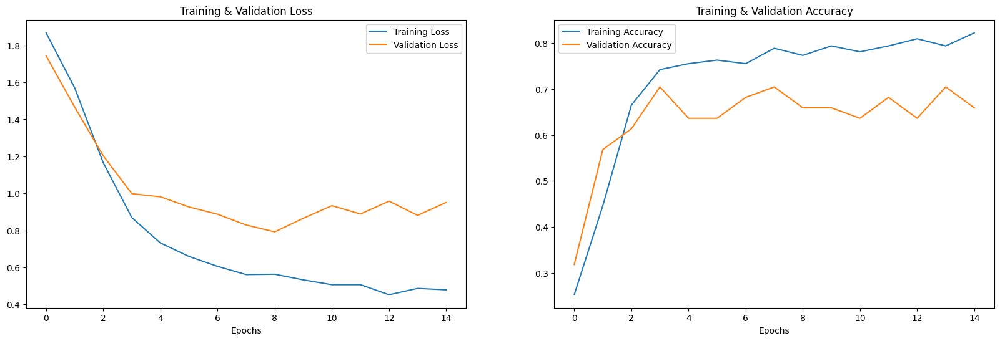

In [ ]:
epochs = [i for i in range(14)]
fig , ax = plt.subplots(1,2)
train_acc = hist.history['accuracy']
train_loss = hist.history['loss']
val_acc = hist.history['val_accuracy']
val_loss = hist.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(train_loss , label = 'Training Loss')
ax[0].plot(val_loss , label = 'Validation Loss')
ax[0].set_title('Training & Validation Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(train_acc , label = 'Training Accuracy')
ax[1].plot(val_acc , label = 'Validation Accuracy')
ax[1].set_title('Training & Validation Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.show()

Evaluating on Train Data

In [ ]:
predt = model.predict(X_train_pad)
predt = np.argmax(predt, axis=1)
predt = [class_names[pred] for pred in predt]
print("Train Accuracy: {:.2f}%".format(accuracy_score(data_train.label, predt) * 100))

13/13 [==============================] - 14s 971ms/step
Train Accuracy: 84.54%


Evaluating on Test Data

In [ ]:
# Evaluating the model
predictions = model.predict(X_test_pad)
predictions = np.argmax(predictions, axis=1)
predictions = [class_names[pred] for pred in predictions]
print("Test Accuracy: {:.2f}%".format(accuracy_score(data_test.label, predictions) * 100))

2/2 [==============================] - 2s 1s/step
Test Accuracy: 58.33%


Confusion Matrix

In [ ]:
# generating Confusion matrix
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    fig, ax = plt.subplots()
    
    fig.set_size_inches(12.5, 7.5)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.grid(False)
    
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    #text annotations
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


F1 Score: 58.33


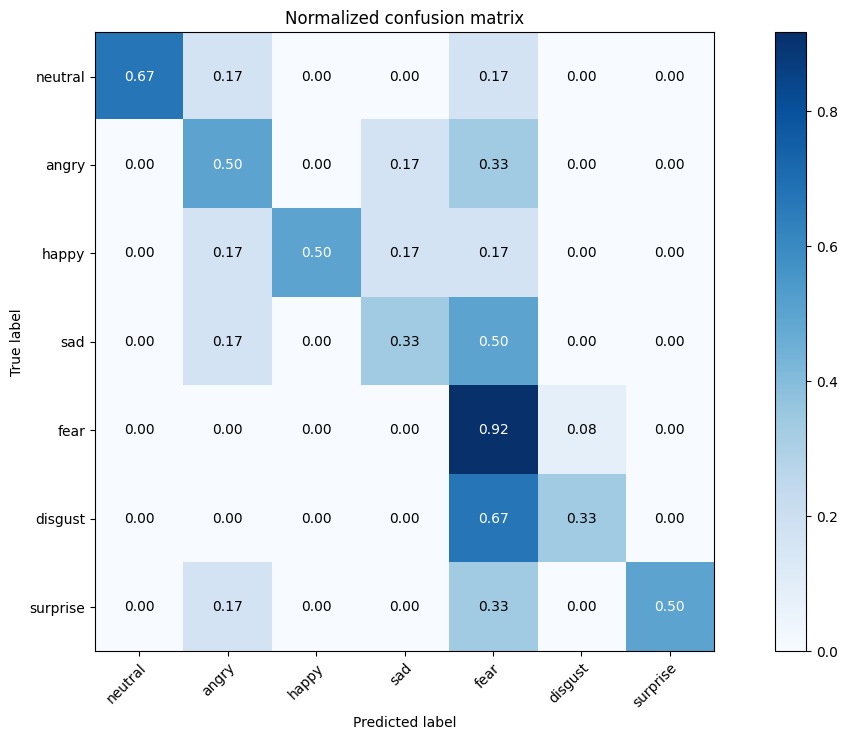

In [ ]:
print("\nF1 Score: {:.2f}".format(f1_score(data_test.label, predictions, average='micro') * 100))

# Plot normalized confusion matrix
plot_confusion_matrix(data_test.label, predictions, classes=class_names, normalize=True, title='Normalized confusion matrix')
plt.show()

Classification Report

In [ ]:
print(classification_report(data_test.label, predictions))

              precision    recall  f1-score   support

       angry       1.00      0.67      0.80         6
     disgust       0.43      0.50      0.46         6
        fear       1.00      0.50      0.67         6
       happy       0.50      0.33      0.40         6
     neutral       0.46      0.92      0.61        12
         sad       0.67      0.33      0.44         6
    surprise       1.00      0.50      0.67         6

    accuracy                           0.58        48
   macro avg       0.72      0.54      0.58        48
weighted avg       0.69      0.58      0.58        48



#### Exploring with Test Data

In [ ]:
df_test_result = pd.DataFrame(data_test)
df_test_result['pred'] = predictions
df_test_result.to_csv(out_loc + '/Text_analysis_predictions.csv')  
df_test_result.head()

,text,file,label,pred
286,straw hats are out of fashion this year,JK_f06.wav,fear,fear
320,she had your dark suit in Greasy wash water al...,JK_sa01.wav,sad,neutral
24,should a dog seat increase the washing with th...,DC_f01.wav,fear,disgust
73,will you tell me why,DC_sa03.wav,sad,neutral
233,will you tell me why,JE_su03.wav,surprise,neutral


In [ ]:
# Testing new outputs
print('Message: {}\nPredicted: {}\nActual: {}'.format(df_test_result['text'].iloc[6], df_test_result['pred'].iloc[6], df_test_result['label'].iloc[6]))

Message: will you tell me why
Predicted: neutral
Actual: happy


As we see that in the output accuracy of speech (audio) based emotion recognition model is 72.91% (approx may change in different runs), and that of the transcribe + language based emotion recognition model is 58.33%(approx may change in different runs). This can be due to various reasons. One of them is the bad transcribing by the google API. But the major reason seems to be the tone not being understood by the text recognition algorithm. Consider a sarcastic remark "Ya right you are the best", as text it might seem to be positive but based on tone one can then tell if the emotion was that of anger.

In [ ]:
print("Bad trancribtion\nNote happend in one of the runs")
file_path = np.array(df_audio.iloc[191])[1]
print("Actual text:\t\tdon't ask me to carry an oily rag like that\nTranscribed text:\t{}".format(df.iloc[191][0]))
Audio(file_path)

Bad trancribtion
Note happend in one of the runs
Actual text:		don't ask me to carry an oily rag like that
Transcribed text:	don't ask me to Karen all he rag like that


In [ ]:
print("Tone of speech based.\nBelow audio predicted sad actually was fear which audio analysis predicted correctly.\nNote happend in one of the runs")
file_path = np.array(df_audio.iloc[15])[1]
Audio(file_path)

Tone of speech based.
Below audio predicted sad actually was fear which audio analysis predicted correctly.
Note happend in one of the runs


In [ ]:
print("\nSimilarly this predicted angry actually was neutral which audio analysis predicted correctly.\nNote happend in one of the runs")
file_path = np.array(df_audio.iloc[314])[1]
Audio(file_path)


Similarly this predicted angry actually was neutral which audio analysis predicted correctly.
Note happend in one of the runs


### Conclusion : Audio Waves vs Transcribed Text


* Using audio wave data to predict the sentiment of a speaker is better than transcribing the text and predicting based on that because audio wave data captures a lot more information than just the words spoken.

* Sentiment is not just conveyed through the words used, but also through non-verbal cues such as tone, pitch, and volume. These non-verbal cues can greatly affect the sentiment of the speaker, and are lost when transcribing the text. For example, a speaker may say "I'm fine" but with a flat, monotone voice, which could actually indicate that they are not fine at all. On the other hand, the same speaker could say "I'm fine!" with an enthusiastic, upbeat tone, which would indicate that they are truly feeling fine.

* When analyzing audio wave data, these non-verbal cues can be captured and used to determine the sentiment of the speaker more accurately. Machine learning models can be trained on audio data to recognize patterns in tone, pitch, and volume that are associated with different sentiments, and use these patterns to make more accurate predictions.

* Overall, using audio wave data to predict sentiment provides a more complete and accurate picture of the speaker's emotions and intent. While transcribing text can be useful in some cases, it is important to remember that sentiment is conveyed through more than just words, and audio data provides a more comprehensive view of the speaker's sentiment.